Encontradas 86437 imagens
Dispositivo: cuda
Epoch 1/5
Train Loss: 0.3729 | Val Loss: 0.0873
Acc: 0.9252 | Prec: 0.9022 | Recall: 0.9730 | F1-macro: 0.9298
------------------------------------------------------------
Epoch 2/5
Train Loss: 0.0636 | Val Loss: 0.3104
Acc: 0.8057 | Prec: 0.8471 | Recall: 0.9153 | F1-macro: 0.8506
------------------------------------------------------------
Epoch 3/5
Train Loss: 0.0428 | Val Loss: 0.0158
Acc: 0.9962 | Prec: 0.9935 | Recall: 0.9960 | F1-macro: 0.9947
------------------------------------------------------------
Epoch 4/5
Train Loss: 0.0557 | Val Loss: 0.0467
Acc: 0.9916 | Prec: 0.9821 | Recall: 0.9758 | F1-macro: 0.9787
------------------------------------------------------------
Epoch 5/5
Train Loss: 0.0179 | Val Loss: 0.0088
Acc: 0.9976 | Prec: 0.9960 | Recall: 0.9974 | F1-macro: 0.9967
------------------------------------------------------------
Treinamento concluído!
Métricas salvas em: resnet18_metrics.csv
Matriz de Confusão:
 [[13449    

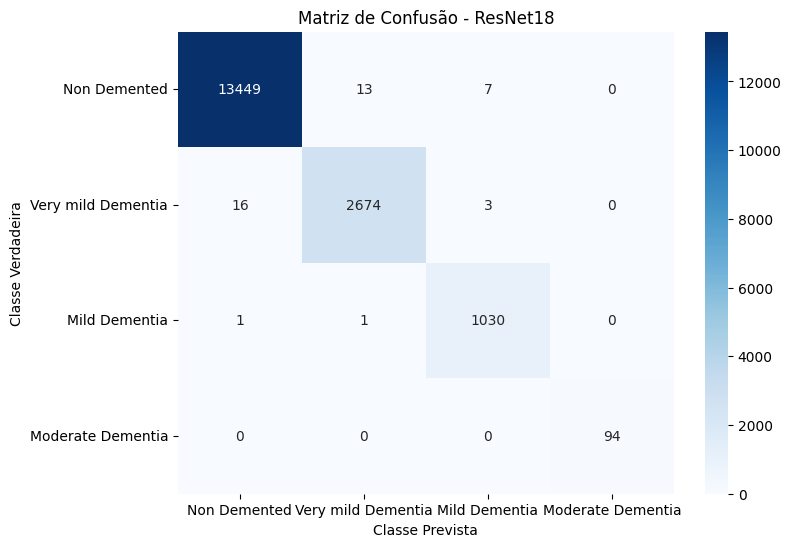

In [1]:
import kagglehub
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models, transforms
from torch.utils.data import DataLoader, Dataset
from pathlib import Path
from PIL import Image
import polars as pl
import time
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import seaborn as sns
import shap

# ============================================================
# Download do dataset OASIS via kagglehub
# Link original: https://www.kaggle.com/datasets/ninadaithal/imagesoasis
# ============================================================
path = kagglehub.dataset_download("ninadaithal/imagesoasis")

# Converter dataset de imagens em DataFrame Polars para EDA
data_path = Path(path) / "Data"

# Coletar paths das imagens usando Polars
image_paths = []
for p in data_path.rglob('*.*'):
    if p.is_file():
        parts = p.parts
        if len(parts) >= 2:
            class_name = parts[-2]  # pasta = classe
            file_name = parts[-1]   # nome do arquivo
            image_paths.append((class_name, file_name, str(p)))

print(f"Encontradas {len(image_paths)} imagens")

# Criar DataFrame Polars
df = pl.DataFrame({
    'class': [x[0] for x in image_paths],
    'image': [x[1] for x in image_paths],
    'path': [x[2] for x in image_paths]
})

# Salvar metadados em arquivo Parquet
output_path = "oasis_dataset_metadata.parquet"
df.write_parquet(output_path)


# ============================================================
# Configurações básicas
# ============================================================
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Dispositivo: {device}")

# Transformações de pré-processamento
transform = transforms.Compose([
    transforms.Resize((248, 496)),
    transforms.CenterCrop((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225])
])

# Dataset personalizado
class OASISDataset(Dataset):
    def __init__(self, df, transform=None):
        self.df = df
        self.transform = transform
        self.class_to_idx = {
            'Non Demented': 0,
            'Very mild Dementia': 1,
            'Mild Dementia': 2,
            'Moderate Dementia': 3
        }

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.row(idx)
        img_path = row[2]
        class_name = row[0]

        image = Image.open(img_path).convert('RGB')
        if self.transform:
            image = self.transform(image)
        label = self.class_to_idx[class_name]
        return image, label

# Carregar metadados
df = pl.read_parquet("oasis_dataset_metadata.parquet")
dataset = OASISDataset(df, transform=transform)

# Split treino/validação
train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size
train_dataset, val_dataset = torch.utils.data.random_split(dataset, [train_size, val_size])

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=2, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False, num_workers=2, pin_memory=True)


# ============================================================
# Modelo ResNet18 (ajustando para evitar problemas com SHAP)
# ============================================================
class SafeResNet18(nn.Module):
    def __init__(self, num_classes=4):
        super(SafeResNet18, self).__init__()
        self.resnet = models.resnet18(weights=None)
        
        # Desativar operações inplace em todas as ReLU
        for m in self.resnet.modules():
            if isinstance(m, nn.ReLU):
                m.inplace = False
        
        num_ftrs = self.resnet.fc.in_features
        self.resnet.fc = nn.Linear(num_ftrs, num_classes)

    def forward(self, x):
        return self.resnet(x)

model = SafeResNet18(num_classes=4).to(device)

# Loss function com pesos (para classes desbalanceadas)
class_weights = torch.tensor([0.3215, 1.5744, 4.3201, 44.2812], dtype=torch.float32).to(device)
criterion = nn.CrossEntropyLoss(weight=class_weights)
optimizer = optim.Adam(model.parameters(), lr=0.0001)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.1)


# ============================================================
# Treinamento
# ============================================================
num_epochs = 5
metrics_history = []

start_time = time.time()
for epoch in range(num_epochs):
    epoch_start = time.time()

    # --- Training ---
    model.train()
    train_loss = 0.0
    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        train_loss += loss.item() * images.size(0)

    # --- Validation ---
    model.eval()
    val_loss = 0.0
    all_labels = []
    all_preds = []

    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item() * images.size(0)

            _, predicted = torch.max(outputs, 1)
            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(predicted.cpu().numpy())

    # Estatísticas
    train_loss = train_loss / len(train_loader.dataset)
    val_loss = val_loss / len(val_loader.dataset)

    acc = accuracy_score(all_labels, all_preds)
    prec = precision_score(all_labels, all_preds, average='macro', zero_division=0)
    rec = recall_score(all_labels, all_preds, average='macro', zero_division=0)
    f1 = f1_score(all_labels, all_preds, average='macro', zero_division=0)

    epoch_time = time.time() - epoch_start

    print(f'Epoch {epoch+1}/{num_epochs}')
    print(f'Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f}')
    print(f'Acc: {acc:.4f} | Prec: {prec:.4f} | Recall: {rec:.4f} | F1-macro: {f1:.4f}')
    print('-' * 60)

    # Guardar métricas
    metrics_history.append({
        "epoch": epoch+1,
        "train_loss": train_loss,
        "val_loss": val_loss,
        "accuracy": acc,
        "precision_macro": prec,
        "recall_macro": rec,
        "f1_macro": f1,
        "epoch_time_sec": epoch_time
    })

    scheduler.step()

print("Treinamento concluído!")

# ============================================================
# Salvar métricas em CSV
# ============================================================
metrics_df = pd.DataFrame(metrics_history)
metrics_df.to_csv("resnet18_metrics.csv", index=False)
print("Métricas salvas em: resnet18_metrics.csv")

# ============================================================
# Matriz de Confusão
# ============================================================
cm = confusion_matrix(all_labels, all_preds)
print("Matriz de Confusão:\n", cm)

# Salvar matriz em arquivo .npy
np.save("resnet18_confusion_matrix.npy", cm)

# --- Plot ---
class_names = ['Non Demented', 'Very mild Dementia', 'Mild Dementia', 'Moderate Dementia']

plt.figure(figsize=(8,6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Classe Prevista')
plt.ylabel('Classe Verdadeira')
plt.title('Matriz de Confusão - ResNet18')
plt.savefig('confusion_matrix.png')
plt.show()

aumentar a quantidade das imagens de fundo `background_data`

Gerando explicações com SHAP...
SHAP values calculados com sucesso!


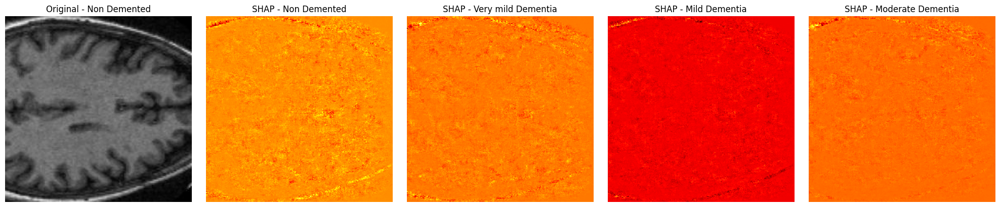

Análise SHAP concluída!
Experimento concluído!


In [2]:
# ============================================================
# SHAP - Interpretação do modelo
# ============================================================
print("Gerando explicações com SHAP...")

try:
    # Configuração mínima para evitar problemas de memória
    #background_data = next(iter(train_loader))[0][:1].to(device)
    background_data = next(iter(train_loader))[0][:5].to(device)  # < -- tentar aqui
    test_images = next(iter(val_loader))[0][:1].to(device)  # Apenas 1 imagem para teste
    test_labels = next(iter(val_loader))[1][:1].cpu().numpy()

    model.eval()

    # Tentar método mais simples primeiro
    explainer = shap.GradientExplainer(model, background_data)
    shap_values = explainer.shap_values(test_images)
    
    print("SHAP values calculados com sucesso!")
    
    # Denormalizar imagens
    def denormalize(img_tensor):
        mean = torch.tensor([0.485, 0.456, 0.406]).view(3,1,1).to(img_tensor.device)
        std = torch.tensor([0.229, 0.224, 0.225]).view(3,1,1).to(img_tensor.device)
        return img_tensor * std + mean

    test_images_denorm = denormalize(test_images)
    test_images_np = test_images_denorm.permute(0, 2, 3, 1).cpu().numpy()
    
    # Método alternativo de plot mais simples
    if isinstance(shap_values, list) and len(shap_values) == 4:
        # Plot manual para cada classe
        fig, axes = plt.subplots(1, 5, figsize=(20, 4))
        
        # Imagem original
        axes[0].imshow(test_images_np[0])
        axes[0].set_title(f'Original - {class_names[test_labels[0]]}')
        axes[0].axis('off')
        
        # SHAP maps para cada classe
        for i in range(4):
            #shap_map = np.mean(shap_values[i][0], axis=0)  # Média dos canais
            shap_map = shap_values[i][0][0]
            
            axes[i+1].imshow(shap_map, cmap='hot')
            axes[i+1].set_title(f'SHAP - {class_names[i]}')
            axes[i+1].axis('off')
        
        plt.tight_layout()
        plt.savefig('shap_analysis.png')
        plt.show()
        
    else:
        # Tentar o plot padrão do SHAP
        shap.image_plot(shap_values, test_images_np, show=False)
        plt.savefig('shap_analysis.png')
        plt.show()
    
    print("Análise SHAP concluída!")
    
except Exception as e:
    print(f"SHAP não pôde ser executado: {e}")
    print("Continuando sem análise SHAP...")

print("Experimento concluído!")

Gerando explicações com SHAP...
SHAP values calculados com sucesso!
Tipo dos shap_values: <class 'list'>
Número de classes: 4
Classe 0: shape (2, 3, 224, 224)
Classe 1: shape (2, 3, 224, 224)
Classe 2: shape (2, 3, 224, 224)
Classe 3: shape (2, 3, 224, 224)


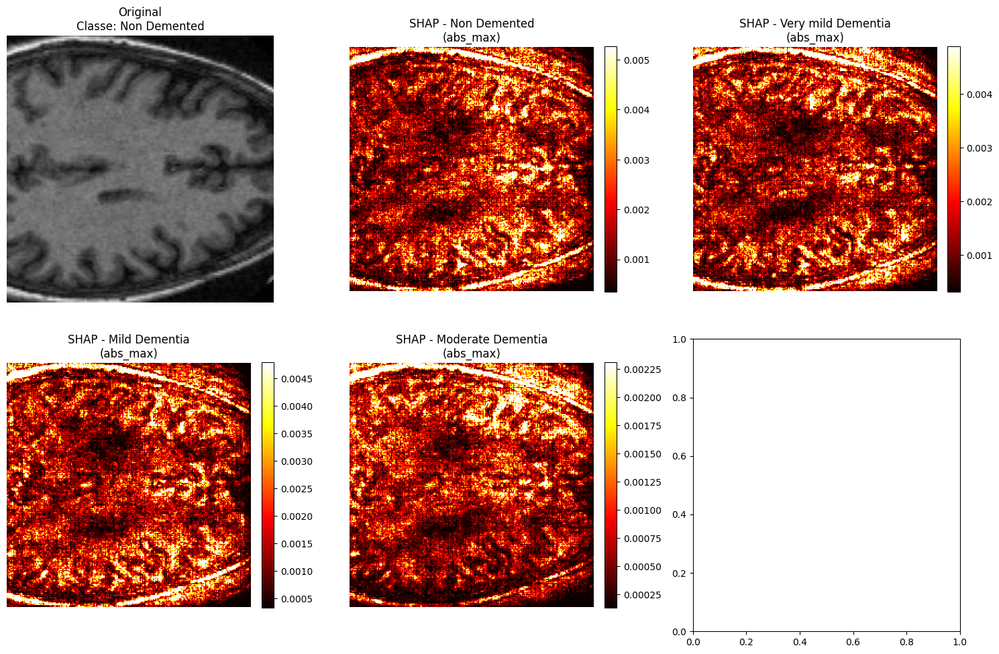

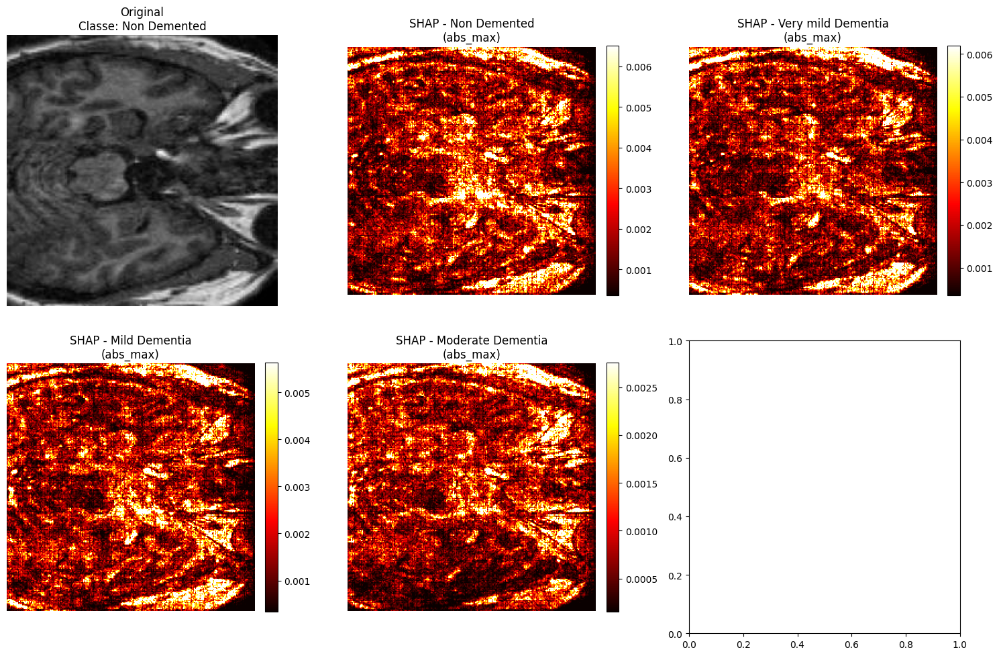

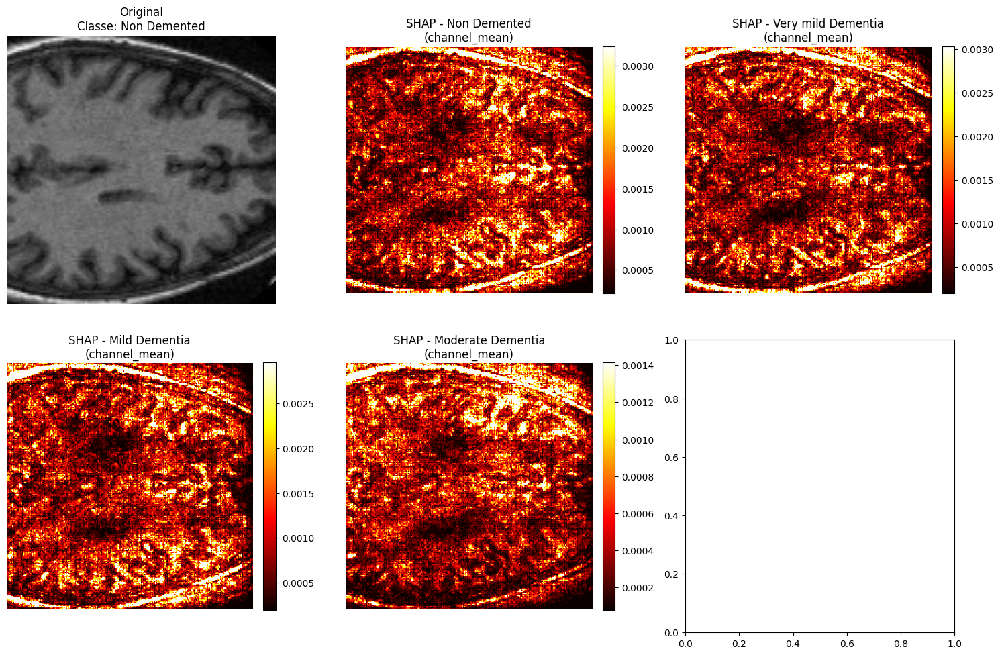

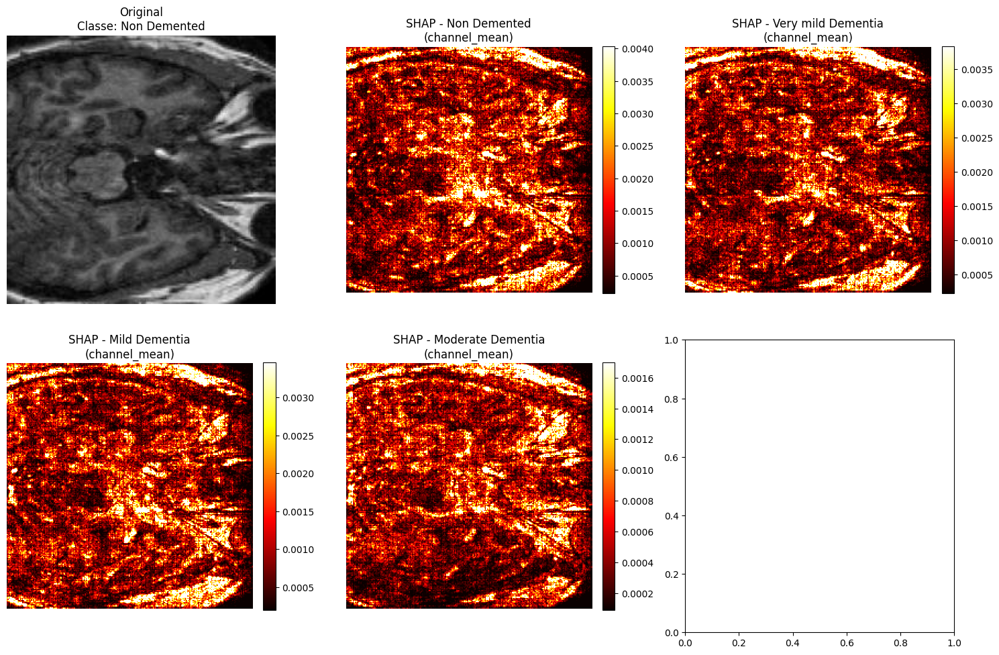

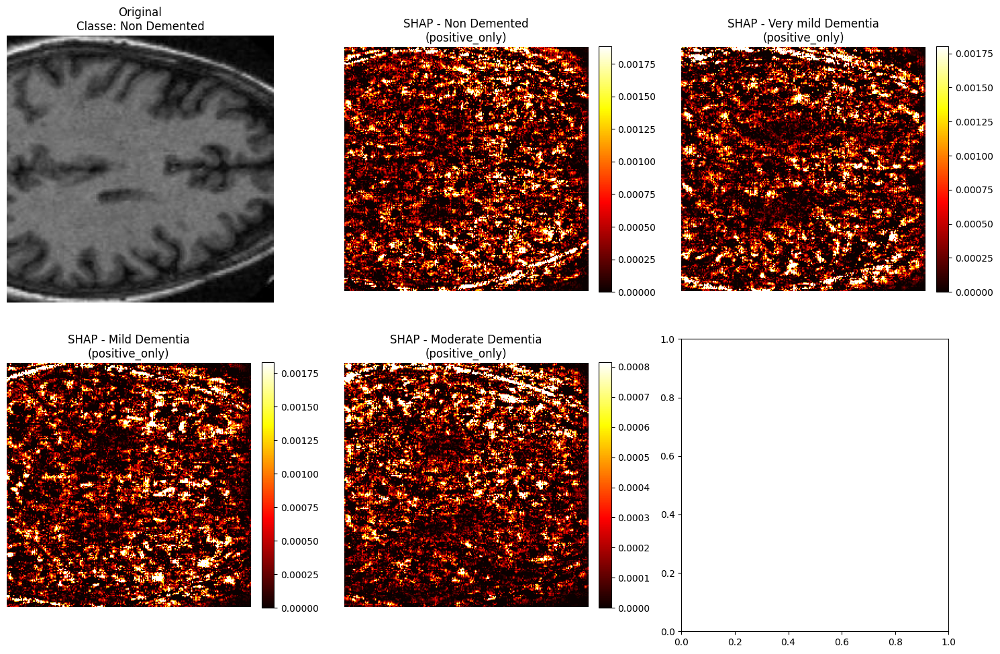

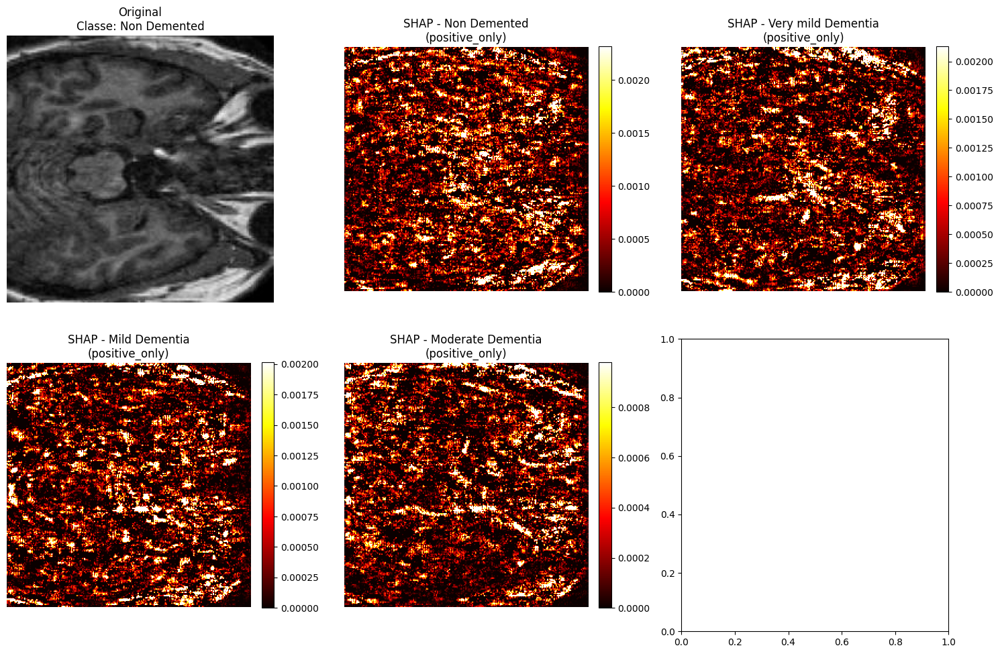


SHAP - OVERLAY NAS IMAGENS ORIGINAIS


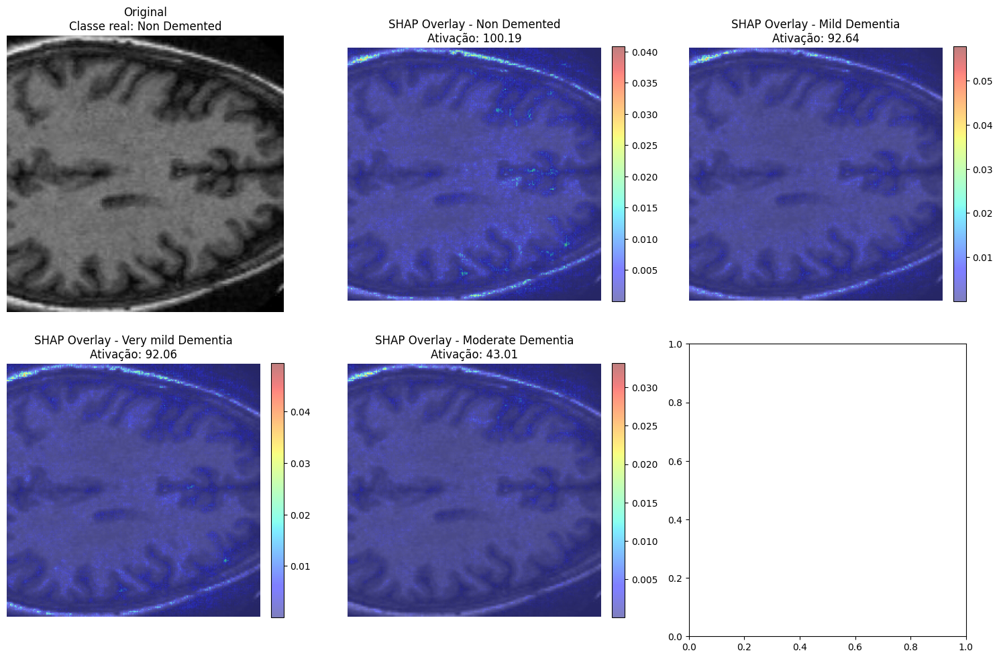

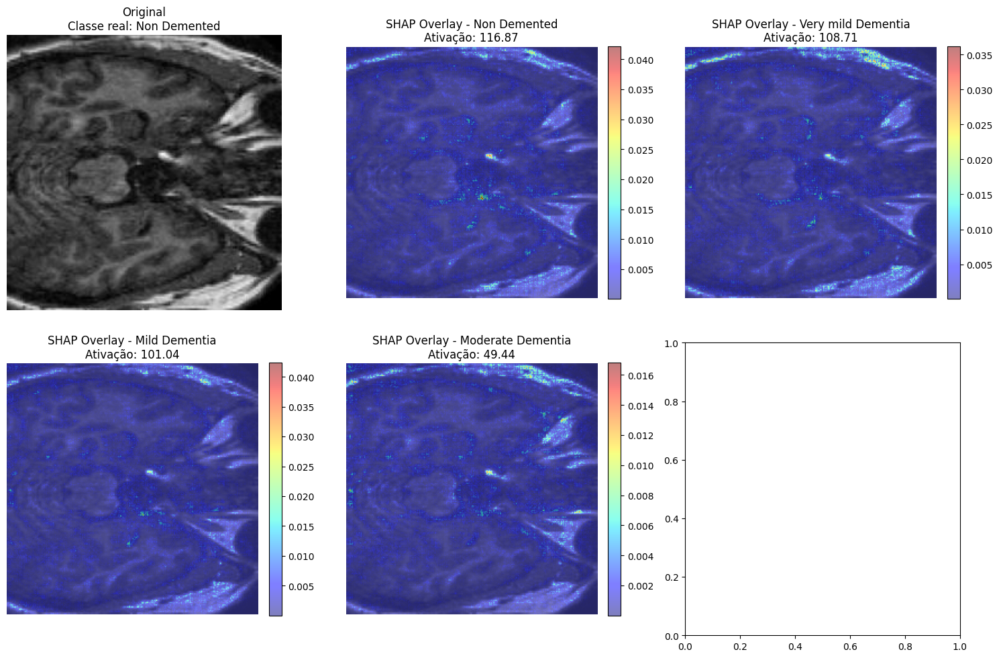


ANÁLISE QUANTITATIVA SHAP:

Imagem 0 - Classe real: Non Demented
  Non Demented: 183.9469
  Mild Dementia: 169.9125
  Very mild Dementia: 168.9843
  Moderate Dementia: 78.6240

Imagem 1 - Classe real: Non Demented
  Non Demented: 214.2918
  Very mild Dementia: 199.5378
  Mild Dementia: 185.5150
  Moderate Dementia: 90.6731
Experimento concluído!


In [3]:
# ============================================================
# SHAP - Interpretação do modelo (VERSÃO MELHORADA)
# ============================================================
print("Gerando explicações com SHAP...")

try:
    # Configuração do background - usar mais imagens para melhor estabilidade
    background_data = next(iter(train_loader))[0][:10].to(device)  # Aumentar para 10 imagens
    test_images = next(iter(val_loader))[0][:2].to(device)  # 2 imagens para comparação
    test_labels = next(iter(val_loader))[1][:2].cpu().numpy()

    model.eval()

    # Método mais robusto - DeepExplainer pode funcionar melhor
    explainer = shap.GradientExplainer(model, background_data)
    shap_values = explainer.shap_values(test_images)
    
    print("SHAP values calculados com sucesso!")
    print(f"Tipo dos shap_values: {type(shap_values)}")
    if isinstance(shap_values, list):
        print(f"Número de classes: {len(shap_values)}")
        for i, sv in enumerate(shap_values):
            print(f"Classe {i}: shape {sv.shape}")
    
    # Denormalizar imagens
    def denormalize(img_tensor):
        mean = torch.tensor([0.485, 0.456, 0.406]).view(3,1,1).to(img_tensor.device)
        std = torch.tensor([0.229, 0.224, 0.225]).view(3,1,1).to(img_tensor.device)
        return img_tensor * std + mean

    test_images_denorm = denormalize(test_images)
    test_images_np = test_images_denorm.permute(0, 2, 3, 1).cpu().numpy()
    
    # FUNÇÃO PARA PROCESSAR SHAP VALUES
    def process_shap_values(shap_values, method='abs_max'):
        """
        Processa os valores SHAP para melhor visualização
        Methods: 'abs_max', 'channel_mean', 'positive_only', 'normalize'
        """
        processed = []
        
        for class_shap in shap_values:
            # Para cada imagem em cada classe
            class_processed = []
            for img_shap in class_shap:
                if method == 'channel_mean':
                    # Média absoluta entre canais
                    img_processed = np.mean(np.abs(img_shap), axis=0)
                elif method == 'abs_max':
                    # Máximo absoluto entre canais
                    img_processed = np.max(np.abs(img_shap), axis=0)
                elif method == 'positive_only':
                    # Apenas valores positivos (contribuições)
                    img_processed = np.maximum(0, np.mean(img_shap, axis=0))
                elif method == 'normalize':
                    # Normalização por canal
                    img_processed = np.mean(img_shap, axis=0)
                    img_processed = (img_processed - img_processed.min()) / (img_processed.max() - img_processed.min() + 1e-8)
                else:
                    img_processed = np.mean(img_shap, axis=0)
                
                class_processed.append(img_processed)
            processed.append(np.array(class_processed))
        
        return processed

    # MÉTODO 1: Visualização comparativa com diferentes processamentos
    if isinstance(shap_values, list) and len(shap_values) == 4:
        
        # Processar SHAP values de diferentes formas
        methods = ['abs_max', 'channel_mean', 'positive_only']
        
        for method in methods:
            processed_shap = process_shap_values(shap_values, method=method)
            
            # Plot para cada imagem de teste
            for img_idx in range(len(test_images)):
                fig, axes = plt.subplots(2, 3, figsize=(15, 10))
                
                # Imagem original
                axes[0,0].imshow(test_images_np[img_idx])
                axes[0,0].set_title(f'Original\nClasse: {class_names[test_labels[img_idx]]}')
                axes[0,0].axis('off')
                
                # SHAP maps para as 4 classes
                for i in range(4):
                    row = (i + 1) // 3
                    col = (i + 1) % 3
                    
                    shap_map = processed_shap[i][img_idx]
                    
                    # Ajustar dinamicamente o vmin/vmax baseado nos percentis
                    vmin = np.percentile(shap_map, 5)
                    vmax = np.percentile(shap_map, 95)
                    
                    im = axes[row, col].imshow(shap_map, cmap='hot', vmin=vmin, vmax=vmax)
                    axes[row, col].set_title(f'SHAP - {class_names[i]}\n({method})')
                    axes[row, col].axis('off')
                    plt.colorbar(im, ax=axes[row, col], fraction=0.046, pad=0.04)
                
                plt.tight_layout()
                plt.savefig(f'shap_analysis_{method}_img{img_idx}.png', dpi=300, bbox_inches='tight')
                plt.show()
        
        # MÉTODO 2: Overlay nas imagens originais
        print("\n" + "="*50)
        print("SHAP - OVERLAY NAS IMAGENS ORIGINAIS")
        print("="*50)
        
        for img_idx in range(len(test_images)):
            fig, axes = plt.subplots(2, 3, figsize=(15, 10))
            
            # Imagem original
            axes[0,0].imshow(test_images_np[img_idx])
            axes[0,0].set_title(f'Original\nClasse real: {class_names[test_labels[img_idx]]}')
            axes[0,0].axis('off')
            
            # Overlay para as classes mais relevantes
            processed_shap = process_shap_values(shap_values, method='abs_max')
            
            # Encontrar as 4 classes com maior ativação
            class_activations = []
            for i in range(4):
                activation = np.sum(np.abs(processed_shap[i][img_idx]))
                class_activations.append((i, activation))
            
            # Ordenar por ativação (maior primeiro)
            class_activations.sort(key=lambda x: x[1], reverse=True)
            
            for plot_idx, (class_idx, activation) in enumerate(class_activations[:4]):
                row = (plot_idx + 1) // 3
                col = (plot_idx + 1) % 3
                
                shap_map = processed_shap[class_idx][img_idx]
                
                # Criar overlay
                axes[row, col].imshow(test_images_np[img_idx], alpha=0.7)
                heatmap = axes[row, col].imshow(shap_map, cmap='jet', alpha=0.5)
                axes[row, col].set_title(f'SHAP Overlay - {class_names[class_idx]}\nAtivação: {activation:.2f}')
                axes[row, col].axis('off')
                plt.colorbar(heatmap, ax=axes[row, col], fraction=0.046, pad=0.04)
            
            plt.tight_layout()
            plt.savefig(f'shap_overlay_img{img_idx}.png', dpi=300, bbox_inches='tight')
            plt.show()
    
    # MÉTODO 3: Análise quantitativa
    print("\nANÁLISE QUANTITATIVA SHAP:")
    if isinstance(shap_values, list):
        for img_idx in range(len(test_images)):
            print(f"\nImagem {img_idx} - Classe real: {class_names[test_labels[img_idx]]}")
            
            # Calcular importância total por classe
            total_importance = []
            for class_idx in range(4):
                shap_abs = np.abs(shap_values[class_idx][img_idx])
                total_importance.append((class_names[class_idx], np.sum(shap_abs)))
            
            # Ordenar por importância
            total_importance.sort(key=lambda x: x[1], reverse=True)
            
            for class_name, importance in total_importance:
                print(f"  {class_name}: {importance:.4f}")

except Exception as e:
    print(f"SHAP não pôde ser executado: {e}")
    import traceback
    traceback.print_exc()
    
    # TENTATIVA ALTERNATIVA COM DEEPEXPLAINER
    print("\nTentando método alternativo (DeepExplainer)...")
    try:
        background_data = next(iter(train_loader))[0][:5].to(device)
        test_images = next(iter(val_loader))[0][:1].to(device)
        
        explainer = shap.DeepExplainer(model, background_data)
        shap_values = explainer.shap_values(test_images)
        
        print("DeepExplainer funcionou! Continuando com análise...")
        # ... (usar o mesmo código de visualização acima)
        
    except Exception as e2:
        print(f"DeepExplainer também falhou: {e2}")
        print("Continuando sem análise SHAP...")

print("Experimento concluído!")

Gerando explicações com LIME...
Formato da imagem original: (224, 224, 3)


  0%|          | 0/1000 [00:00<?, ?it/s]

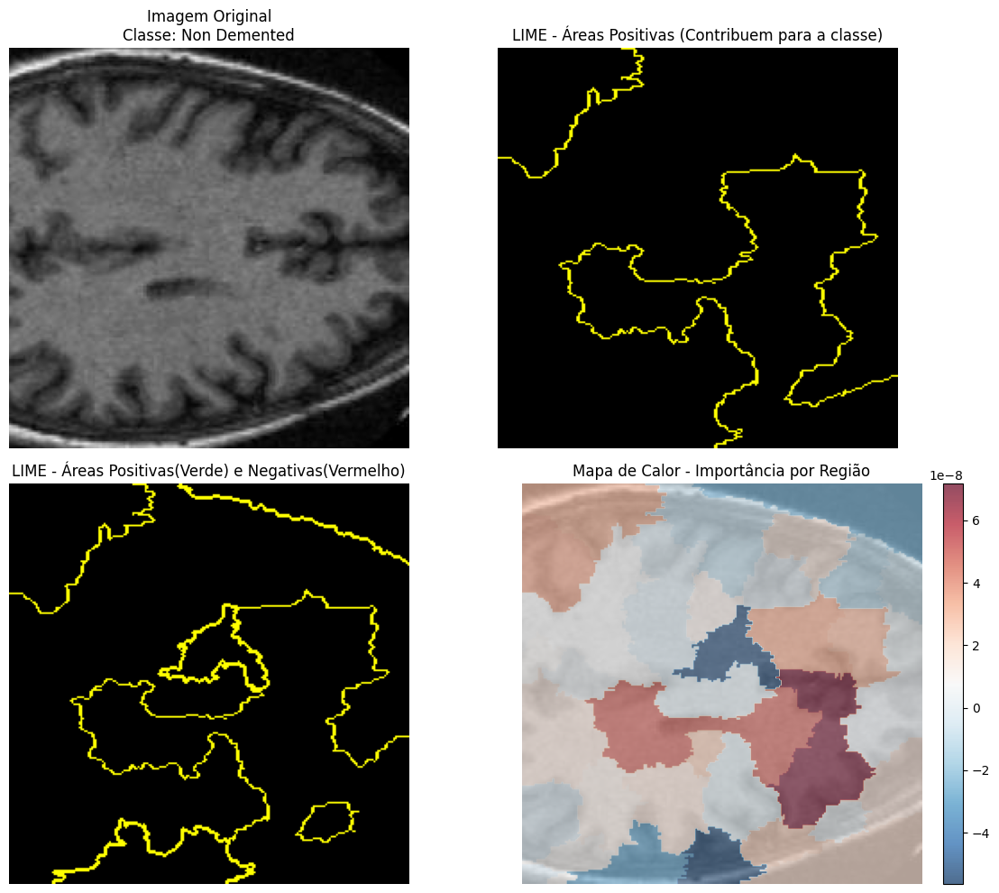


ANÁLISE DETALHADA LIME
Classe predita: Non Demented
Probabilidade: 1.000

Features mais importantes (positivas):
  Superpixel 27: +0.000
  Superpixel 21: +0.000
  Superpixel 23: +0.000
  Superpixel 6: +0.000
  Superpixel 13: +0.000

Features mais importantes (negativas):
  Superpixel 18: -0.000
  Superpixel 34: -0.000
  Superpixel 37: -0.000
  Superpixel 1: -0.000
  Superpixel 7: -0.000

Análise LIME concluída com sucesso!


In [4]:
# ============================================================
# LIME - Interpretação do modelo
# ============================================================
print("Gerando explicações com LIME...")

try:
    from lime import lime_image
    from skimage.segmentation import mark_boundaries
    from skimage.transform import resize
    import matplotlib.patches as patches

    explainer = lime_image.LimeImageExplainer()

    def predict_fn(images_numpy):
        """Função de predição melhorada"""
        model.eval()
        # Garantir que as imagens estão no formato correto [0,1] e no device certo
        images_tensor = torch.tensor(images_numpy).permute(0,3,1,2).float().to(device)
        
        # Normalizar se necessário (dependendo do seu modelo)
        # images_tensor = (images_tensor - 0.5) / 0.5  # descomente se seu modelo usa normalização
        
        with torch.no_grad():
            outputs = model(images_tensor)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
        return probs

    # Escolher uma imagem de teste
    i = 0
    test_image = test_images_np[i]
    
    print(f"Formato da imagem original: {test_image.shape}")
    
    # EXPLICAÇÃO DETALHADA - PARÂMETROS CORRETOS
    explanation = explainer.explain_instance(
        test_image,
        predict_fn,
        top_labels=3,  # Reduzir para focar nas classes mais relevantes
        hide_color=0,
        num_samples=1000,  # Aumentar amostras para melhor precisão
        # batch_size=32,  # REMOVIDO - não é suportado
        # random_state=42  # REMOVIDO - não é suportado
    )

    # VISUALIZAÇÃO MELHORADA
    fig, axes = plt.subplots(2, 2, figsize=(12, 10))
    
    # 1. Imagem Original
    axes[0,0].imshow(test_image)
    axes[0,0].set_title(f'Imagem Original\nClasse: {class_names[test_labels[i]]}')
    axes[0,0].axis('off')
    
    # 2. Explicação LIME - apenas áreas positivas
    temp_pos, mask_pos = explanation.get_image_and_mask(
        explanation.top_labels[0],
        positive_only=True,
        num_features=10,
        hide_rest=False
        # min_weight=0.01  # REMOVIDO - não é suportado
    )
    
    axes[0,1].imshow(mark_boundaries(temp_pos / 255.0, mask_pos))
    axes[0,1].set_title('LIME - Áreas Positivas (Contribuem para a classe)')
    axes[0,1].axis('off')
    
    # 3. Explicação LIME - áreas positivas e negativas
    temp_both, mask_both = explanation.get_image_and_mask(
        explanation.top_labels[0],
        positive_only=False,
        num_features=15,
        hide_rest=False
    )
    
    axes[1,0].imshow(mark_boundaries(temp_both / 255.0, mask_both))
    axes[1,0].set_title('LIME - Áreas Positivas(Verde) e Negativas(Vermelho)')
    axes[1,0].axis('off')
    
    # 4. Mapa de importância
    # Gerar heatmap das importâncias
    ind = explanation.top_labels[0]
    dict_heatmap = dict(explanation.local_exp[ind])
    heatmap = np.vectorize(dict_heatmap.get)(explanation.segments) 
    
    im = axes[1,1].imshow(heatmap, cmap='RdBu_r', alpha=0.7)
    axes[1,1].imshow(test_image, alpha=0.3)
    axes[1,1].set_title('Mapa de Calor - Importância por Região')
    axes[1,1].axis('off')
    plt.colorbar(im, ax=axes[1,1], fraction=0.046, pad=0.04)
    
    plt.tight_layout()
    plt.savefig('lime_analysis_improved.png', dpi=300, bbox_inches='tight')
    plt.show()

    # ANÁLISE TEXTUAL DETALHADA
    print("\n" + "="*50)
    print("ANÁLISE DETALHADA LIME")
    print("="*50)
    
    top_label = explanation.top_labels[0]
    predicted_probs = predict_fn(np.array([test_image]))[0]
    print(f"Classe predita: {class_names[top_label]}")
    print(f"Probabilidade: {predicted_probs[top_label]:.3f}")
    
    # Mostrar as features mais importantes
    print("\nFeatures mais importantes (positivas):")
    positive_features = [(f, w) for f, w in explanation.local_exp[top_label] if w > 0]
    for feature, weight in positive_features[:5]:  # Mostrar apenas top 5
        print(f"  Superpixel {feature}: +{weight:.3f}")
    
    print("\nFeatures mais importantes (negativas):")
    negative_features = [(f, w) for f, w in explanation.local_exp[top_label] if w < 0]
    for feature, weight in negative_features[:5]:  # Mostrar apenas top 5
        print(f"  Superpixel {feature}: {weight:.3f}")

    print("\nAnálise LIME concluída com sucesso!")

except Exception as e:
    print(f"LIME não pôde ser executado: {e}")
    import traceback
    traceback.print_exc()
    print("Continuando sem análise LIME...")

Explorando os dados de forma visual e acessível...


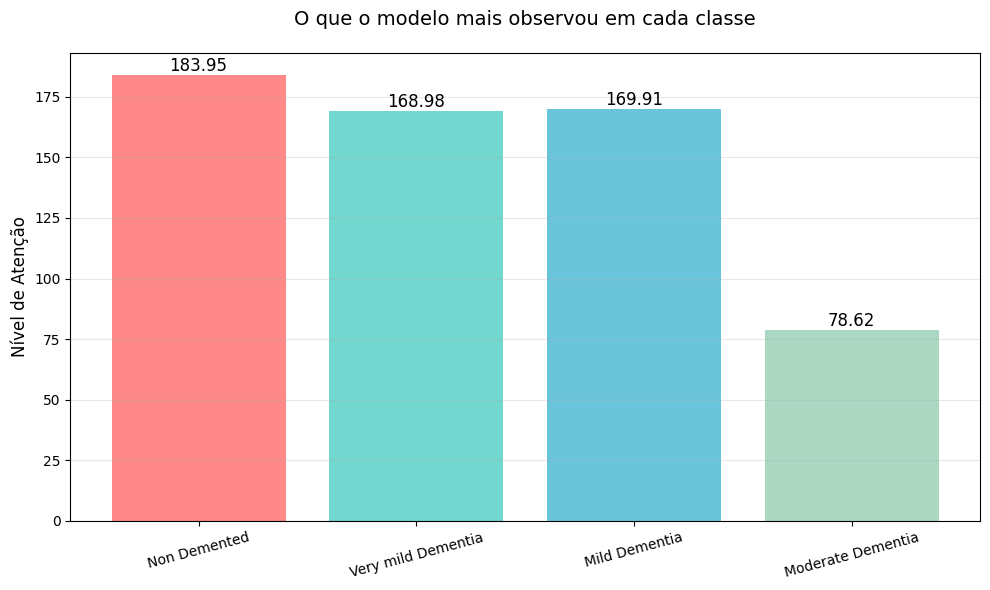

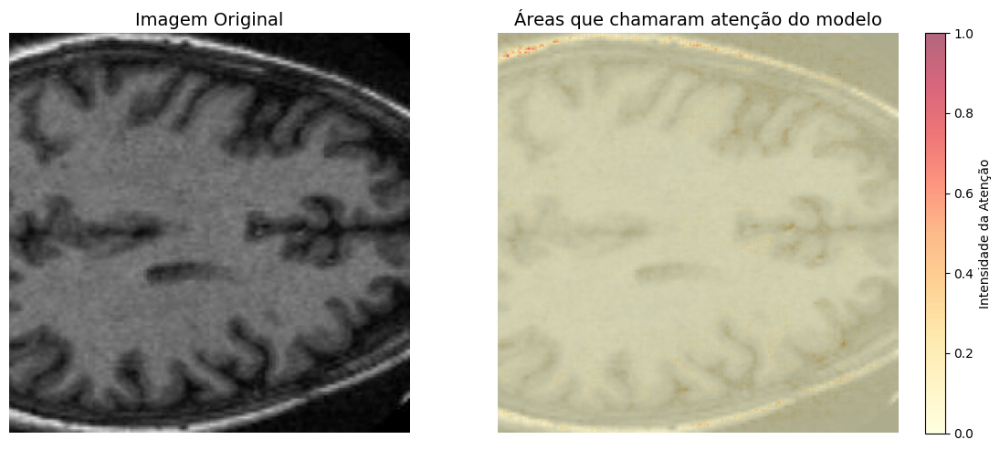

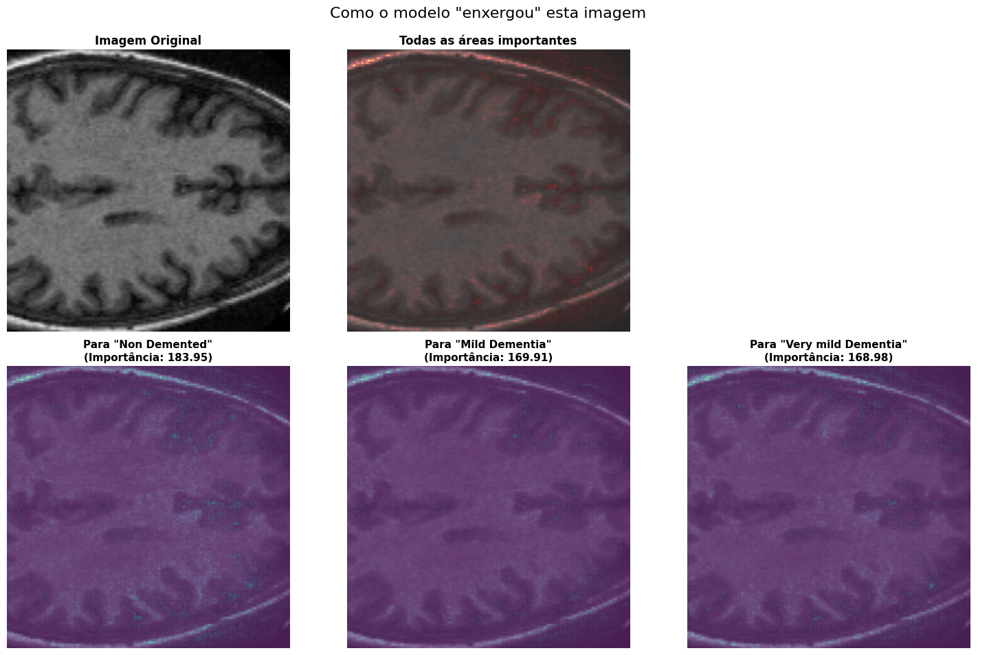

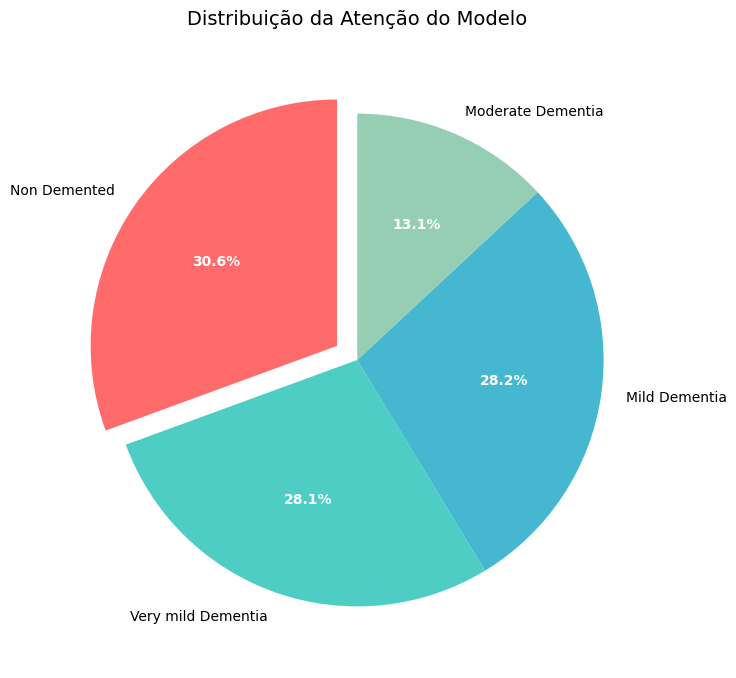


RELATÓRIO SIMPLES - ANÁLISE DA IMAGEM

**Análise da Imagem:**
   • Classe mais provável: 'Non Demented'
   • Segunda opção: 'Mild Dementia'
   • Confiança na decisão: 30.6%

**Padrões identificados:**
   • O modelo considera múltiplas possibilidades

**Para leigos:**
   O algoritmo de IA analisou esta imagem e identificou padrões
   que se assemelham mais a 'Non Demented'.
   As áreas coloridas mostram onde o modelo 'prestou atenção'.

Visualizações amigáveis criadas com sucesso!


In [8]:
# ============================================================
# EXPLORAÇÃO VISUAL DOS DADOS
# ============================================================
print("Explorando os dados de forma visual e acessível...")

def criar_visualizacoes_leigos(shap_values, test_images_np, test_labels, class_names):
    """
    Cria visualizações simples e intuitivas para apresentação
    """
    
    # 1. GRÁFICO DE BARRAS - IMPORTÂNCIA DAS CLASSES
    plt.figure(figsize=(10, 6))
    
    # Calcular importância total por classe
    importancias = []
    for i in range(4):
        importancia_total = np.sum(np.abs(shap_values[i][0]))
        importancias.append(importancia_total)
    
    cores = ['#FF6B6B', '#4ECDC4', '#45B7D1', '#96CEB4']
    barras = plt.bar(class_names, importancias, color=cores, alpha=0.8)
    
    # Adicionar valores nas barras
    for barra, valor in zip(barras, importancias):
        plt.text(barra.get_x() + barra.get_width()/2, barra.get_height() + 0.01,
                f'{valor:.2f}', ha='center', va='bottom', fontsize=12)
    
    plt.title('O que o modelo mais observou em cada classe', fontsize=14, pad=20)
    plt.ylabel('Nível de Atenção', fontsize=12)
    plt.xticks(rotation=15)
    plt.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    plt.savefig('importancia_classes.png', dpi=300, bbox_inches='tight')  # --> como posso chamar esse arquivo?
    plt.show()
    
    # 2. MAPA DE CALOR SIMPLIFICADO - "MAPAS DE ATENÇÃO"
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    
    # Imagem original
    axes[0].imshow(test_images_np[0])
    axes[0].set_title('Imagem Original', fontsize=14)
    axes[0].axis('off')
    
    # Mapa de atenção (combinação de todas as classes)
    mapa_atencao = np.zeros_like(shap_values[0][0][0])
    for i in range(4):
        mapa_atencao += np.abs(np.mean(shap_values[i][0], axis=0))
    
    # Normalizar
    mapa_atencao = (mapa_atencao - mapa_atencao.min()) / (mapa_atencao.max() - mapa_atencao.min())
    
    # Overlay suave
    axes[1].imshow(test_images_np[0], alpha=0.8)
    im = axes[1].imshow(mapa_atencao, cmap='YlOrRd', alpha=0.6)
    axes[1].set_title('Áreas que chamaram atenção do modelo', fontsize=14)
    axes[1].axis('off')
    plt.colorbar(im, ax=axes[1], label='Intensidade da Atenção')
    
    plt.tight_layout()
    plt.savefig('mapa_atencao.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    # 3. COMPARAÇÃO LADO A LADO - "O QUE O MODELO PENSOU"
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    
    # Título geral
    fig.suptitle('Como o modelo "enxergou" esta imagem\n', fontsize=16, y=0.95)
    
    # Linha 1: Original e mapa geral
    axes[0,0].imshow(test_images_np[0])
    axes[0,0].set_title('Imagem Original', fontweight='bold')
    axes[0,0].axis('off')
    
    axes[0,1].imshow(test_images_np[0], alpha=0.7)
    axes[0,1].imshow(mapa_atencao, cmap='hot', alpha=0.5)
    axes[0,1].set_title('\nTodas as áreas importantes', fontweight='bold')
    axes[0,1].axis('off')
    
    axes[0,2].axis('off')  # Espaço vazio
    
    # Linha 2: Top 3 classes
    # Encontrar classes mais importantes
    class_ranking = []
    for i in range(4):
        importancia = np.sum(np.abs(shap_values[i][0]))
        class_ranking.append((class_names[i], importancia, i))
    
    class_ranking.sort(key=lambda x: x[1], reverse=True)
    
    for idx, (class_name, importancia, class_idx) in enumerate(class_ranking[:3]):
        mapa_classe = np.mean(np.abs(shap_values[class_idx][0]), axis=0)
        mapa_classe = (mapa_classe - mapa_classe.min()) / (mapa_classe.max() - mapa_classe.min() + 1e-8)
        
        axes[1,idx].imshow(test_images_np[0], alpha=0.7)
        axes[1,idx].imshow(mapa_classe, cmap='viridis', alpha=0.6)
        axes[1,idx].set_title(f'Para "{class_name}"\n(Importância: {importancia:.2f})', 
                            fontweight='bold', fontsize=11)
        axes[1,idx].axis('off')
    
    plt.tight_layout()
    plt.savefig('analise_completa.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    # 4. GRÁFICO DE PIZZA - DISTRIBUIÇÃO DA ATENÇÃO
    plt.figure(figsize=(8, 8))
    
    total_importancia = sum(importancias)
    porcentagens = [imp/total_importancia * 100 for imp in importancias]
    
    explode = [0.1 if i == np.argmax(importancias) else 0 for i in range(4)]
    
    wedges, texts, autotexts = plt.pie(porcentagens, labels=class_names, autopct='%1.1f%%',
                                      explode=explode, colors=cores, startangle=90)
    
    # Melhorar aparência
    for autotext in autotexts:
        autotext.set_color('white')
        autotext.set_fontweight('bold')
    
    plt.title('Distribuição da Atenção do Modelo', fontsize=14, pad=20)
    plt.savefig('distribuicao_atencao.png', dpi=300, bbox_inches='tight')
    plt.show()
    
    # 5. EXPLICAÇÃO TEXTUAL SIMPLES
    print("\n" + "="*60)
    print("RELATÓRIO SIMPLES - ANÁLISE DA IMAGEM")
    print("="*60)
    
    classe_principal = class_ranking[0][0]
    segunda_classe = class_ranking[1][0]
    
    print(f"\n**Análise da Imagem:**")
    print(f"   • Classe mais provável: '{classe_principal}'")
    print(f"   • Segunda opção: '{segunda_classe}'")
    print(f"   • Confiança na decisão: {class_ranking[0][1]/total_importancia*100:.1f}%")
    
    print(f"\n**Padrões identificados:**")
    if class_ranking[0][1] > total_importancia * 0.4:
        print(f"   • O modelo está bastante confiante na classe '{classe_principal}'")
    else:
        print(f"   • O modelo considera múltiplas possibilidades")
    
    print(f"\n**Para leigos:**")
    print(f"   O algoritmo de IA analisou esta imagem e identificou padrões")
    print(f"   que se assemelham mais a '{classe_principal}'.")
    print(f"   As áreas coloridas mostram onde o modelo 'prestou atenção'.")

# Usar a função
try:
    if 'shap_values' in locals() and isinstance(shap_values, list):
        criar_visualizacoes_leigos(shap_values, test_images_np, test_labels, class_names)
        print("\nVisualizações amigáveis criadas com sucesso!")
except Exception as e:
    print(f"Erro ao criar visualizações amigáveis: {e}")